In [1]:
import os
import pickle
import gzip
import gc
from tqdm import tqdm
import torch
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import cv2

from itertools import product

WARPED="_warped"

TRAIN_CROPS = [f"../input/made2-hw2-segmentation-pred-train-{f}{masked}-{res}/train{WARPED}_crops_{f}_{i}.pthz" for f,res,masked,i in product(range(5),[256,384],["","m"],range(0,5200,750))]
TRAIN_META =  [f"../input/made2-hw2-segmentation-pred-train-{f}{masked}-{res}/train_candidates_{f}_{i}.pthz" for f,res,masked,i in product(range(5),[256,384],["","m"],range(0,5200,750))]


TEST_CROPS = [f"../input/made2-hw2-segmentation-pred-test{masked}-{res}/test{WARPED}_crops_0_{i}.pthz" for res,masked,i in product([256,384],["","-m"],range(0,3200,800))]
TEST_META =  [f"../input/made2-hw2-segmentation-pred-test{masked}-{res}/test_candidates_0_{i}.pthz" for res,masked,i in product([256,384],["","-m"],range(0,3200,800))]


In [2]:
for f in TRAIN_CROPS+TRAIN_META+TEST_CROPS+TEST_META:
    if not os.path.exists(f):
        print(f)

In [3]:
def iou(r1,r2):
    xl=max(r1['l'],r2['l'])
    xr=min(r1['r'],r2['r'])
    yt=max(r1['t'],r2['t'])
    yb=min(r1['b'],r2['b'])
    inter = max(0, xr - xl + 1) * max(0, yb - yt + 1)
    union = r1['w']*r1['h']+r2['w']*r2['h'] - inter
    return 0 if union<=0 else inter/union

def process_candidates(df,iou_threshold=0.5):
    df.sort_values(['img_idx','l','t'],inplace=True)
    df['crop_idx']=-1
    for img_idx, img_df in tqdm(df.groupby('img_idx')):
        crop_idx = 0
        for i in range(img_df.shape[0]):
            i_idx=img_df.iloc[i]['index']
            if df.loc[i_idx,'crop_idx'] == -1:
                df.loc[i_idx,'crop_idx'] = crop_idx
                crop_idx = crop_idx+1
            for j in range(i+1,img_df.shape[0]):
                if iou(img_df.iloc[i],img_df.iloc[j])>iou_threshold:
                    df.loc[img_df.iloc[j]['index'],'crop_idx'] = df.loc[i_idx,'crop_idx']

def draw_candidates(df, idx):
    df=df[df.img_idx==idx]
    filename = df.iloc[0]['filename']
    plt.figure(figsize=(16,12))
    image = cv2.imread('../input/carplates/data/data/'+filename)[:,:,::-1]
    for idx,c in df.iterrows():
        image = cv2.UMat(image)
        l, r, t, b, x, y = c['l'], c['r'], c['t'], c['b'], c['x'], c['y']
        pts = np.array([[l, b], [l, t], [r, t], [r, b]], dtype=np.int32)
        color = [(255, 0, 0),(0, 255, 0),(0, 0, 255),(0, 255, 255),(255, 0, 255),(255, 255, 0),(255, 255, 255)][c['crop_idx']%7]
        image = cv2.polylines(image, [pts.reshape(-1, 1, 2)], True, color, lineType=cv2.LINE_AA)
        image = cv2.putText(image, str(c['crop_idx']),  (x, y), cv2.FONT_HERSHEY_SIMPLEX, 1, color, 1, cv2.LINE_AA) 
    plt.imshow(cv2.UMat.get(image))

                    
def merge_candidates(meta_files):
    all_candidates = []
    for fmeta in tqdm(meta_files):
        with gzip.open(fmeta, 'rb', 5) as f:
            candidates = torch.load(f)
        all_candidates = all_candidates + candidates
    df=pd.DataFrame(all_candidates)
    df.drop(['raw_box','box','cl','cr','ct','cb','cx','cy'],axis=1,inplace=True)
    df.reset_index(inplace=True)
    process_candidates(df)
    return df

def merge_crops_by_class(crop_files, df, cls, filename):
    all_crops = np.zeros((df[df['class']==cls].shape[0], 64, 192, 3), dtype=np.uint8)
    src = 0
    dst = 0
    for fcrop in tqdm(crop_files):
        with gzip.open(fcrop, 'rb', 5) as f:
            crops = torch.load(f)
        for i in range(crops.shape[0]):
            if df.loc[src,'class']:
                all_crops[dst,:,:,:] = crops[i,:,:,:]
                df.loc[src,'index'] = dst
                dst = dst+1
            src = src+1
        del crops
    assert dst==all_crops.shape[0]
    assert src==df.shape[0]
    print(all_crops.shape)
    np.savez_compressed(filename, crops=all_crops)
    
def merge_crops(crop_files, df, filename):
    all_crops = np.zeros((df.shape[0], 64, 192, 3), dtype=np.uint8)
    src = 0
    dst = 0
    for fcrop in tqdm(crop_files):
        with gzip.open(fcrop, 'rb', 5) as f:
            crops = torch.load(f)
        for i in range(crops.shape[0]):
            all_crops[dst,:,:,:] = crops[i,:,:,:]
            dst = dst+1
            src = src+1
        del crops
    assert dst==all_crops.shape[0]
    assert src==df.shape[0]
    print(all_crops.shape)
    np.savez_compressed(filename, crops=all_crops)

In [4]:
train_candidates = merge_candidates(TRAIN_META)
merge_crops_by_class(TRAIN_CROPS, train_candidates, True, "train_crops.npz")
train_candidates = train_candidates[train_candidates['class']==True]
train_candidates.to_csv("train_meta.csv",index=False)
print(len(train_candidates))

100%|██████████| 140/140 [05:22<00:00,  2.31s/it]


(123252, 64, 192, 3)
123252


In [5]:
test_candidates = merge_candidates(TEST_META)
merge_crops(TEST_CROPS, test_candidates, "test_crops.npz")
test_candidates.to_csv("test_meta.csv",index=False)
print(len(test_candidates))

100%|██████████| 16/16 [00:21<00:00,  1.35s/it]


(41146, 64, 192, 3)
41146


In [6]:
!ls -l

total 3444912
---------- 1 root root       6470 Jun 19 19:25 __notebook__.ipynb
-rw-r--r-- 1 root root  619675585 Jun 19 20:19 test_crops.npz
-rw-r--r-- 1 root root    3047956 Jun 19 20:19 test_meta.csv
-rw-r--r-- 1 root root 2893678955 Jun 19 20:13 train_crops.npz
-rw-r--r-- 1 root root   11168186 Jun 19 20:13 train_meta.csv


In [7]:
!head train_meta.csv

index,img_idx,filename,l,r,t,b,x,y,w,h,conf,text,class,crop_idx
0,0,train/0.jpg,0,793,796,1121,396,958,793,325,tensor(0.1373),B060BB125,True,0
6025,0,train/0.jpg,0,793,796,1121,396,958,793,325,tensor(0.1373),B060BB125,True,0
12050,0,train/0.jpg,0,802,798,1123,401,960,802,325,tensor(0.1428),B060BB125,True,0
18585,0,train/0.jpg,0,802,798,1123,401,960,802,325,tensor(0.1428),B060BB125,True,0
12051,1,train/1.jpg,650,1136,563,760,893,661,486,197,tensor(0.1306),M938OX116,True,0
18586,1,train/1.jpg,650,1136,563,760,893,661,486,197,tensor(0.1306),M938OX116,True,0
1,1,train/1.jpg,656,1131,559,753,893,656,475,194,tensor(0.1295),M938OX116,True,0
6026,1,train/1.jpg,656,1131,559,753,893,656,475,194,tensor(0.1295),M938OX116,True,0
12754,1,train/1.jpg,905,1025,246,295,965,270,120,49,tensor(0.1245),H881OA116,True,3


In [8]:
!head test_meta.csv

index,img_idx,filename,l,r,t,b,x,y,w,h,conf,text,class,crop_idx
1341,0,test/0.jpg,324,370,969,988,347,978,46,19,tensor(0.1105),,,0
9119,0,test/0.jpg,324,370,969,988,347,978,46,19,tensor(0.1105),,,0
0,0,test/0.jpg,334,912,460,696,623,578,578,236,tensor(0.1303),,,1
7778,0,test/0.jpg,334,912,460,696,623,578,578,236,tensor(0.1303),,,1
15556,0,test/0.jpg,343,900,471,698,621,584,557,227,tensor(0.1343),,,1
28351,0,test/0.jpg,343,900,471,698,621,584,557,227,tensor(0.1343),,,1
800,0,test/0.jpg,435,522,929,964,478,946,87,35,tensor(0.0026),,,2
8578,0,test/0.jpg,435,522,929,964,478,946,87,35,tensor(0.0026),,,2
16356,0,test/0.jpg,452,684,891,984,568,937,232,93,tensor(0.1310),,,3


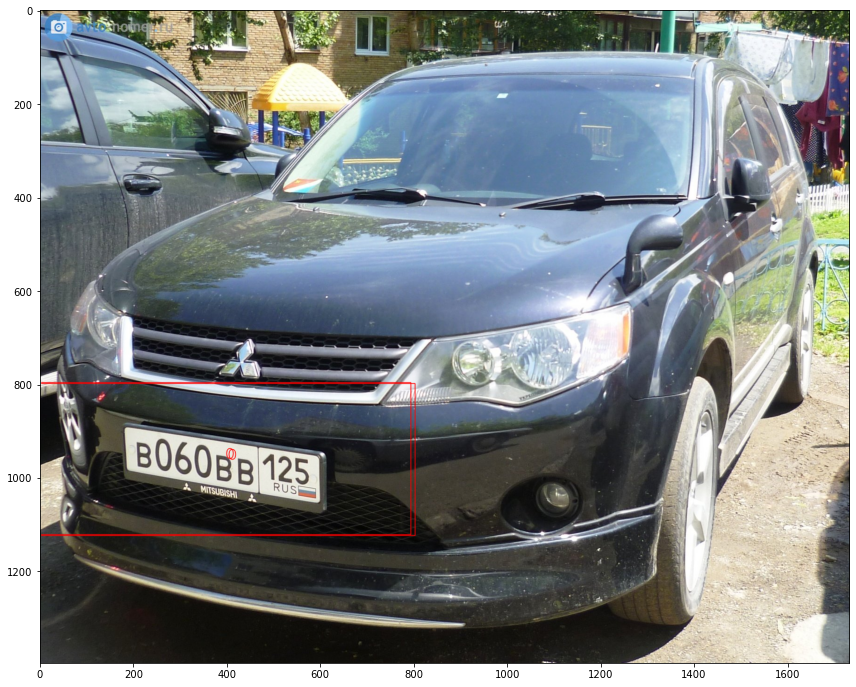

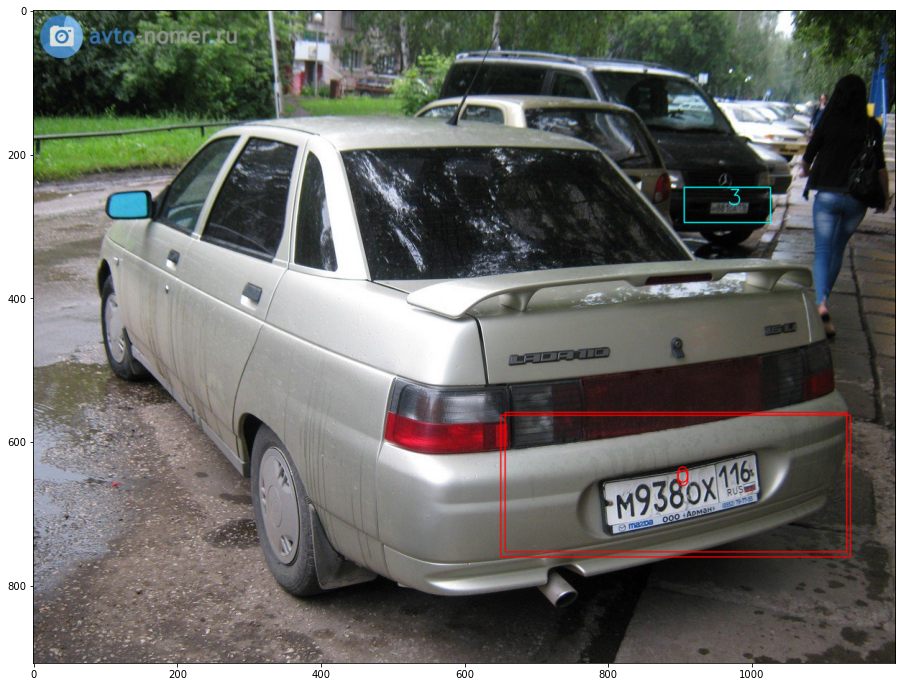

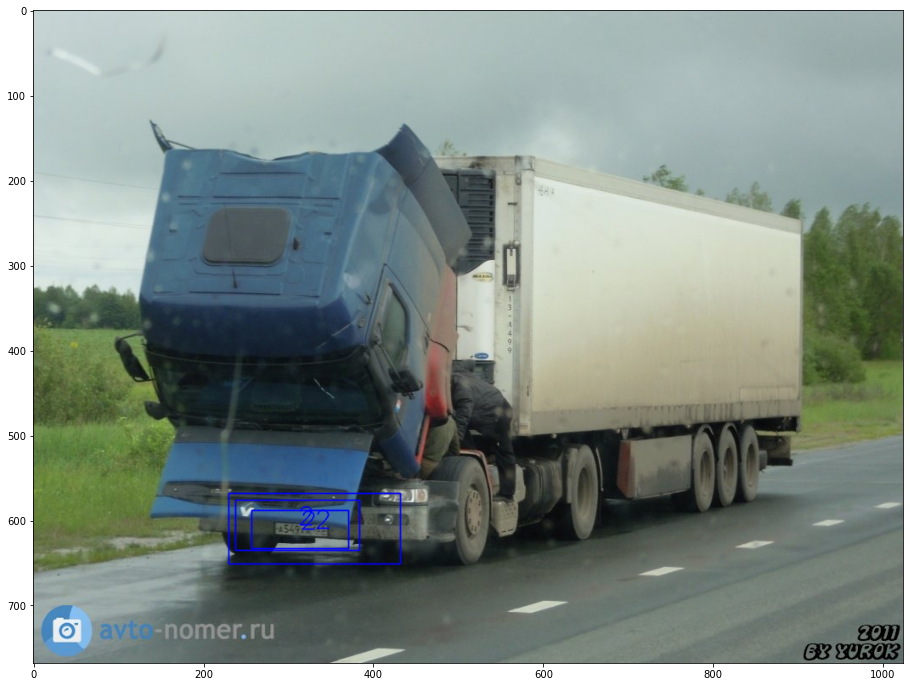

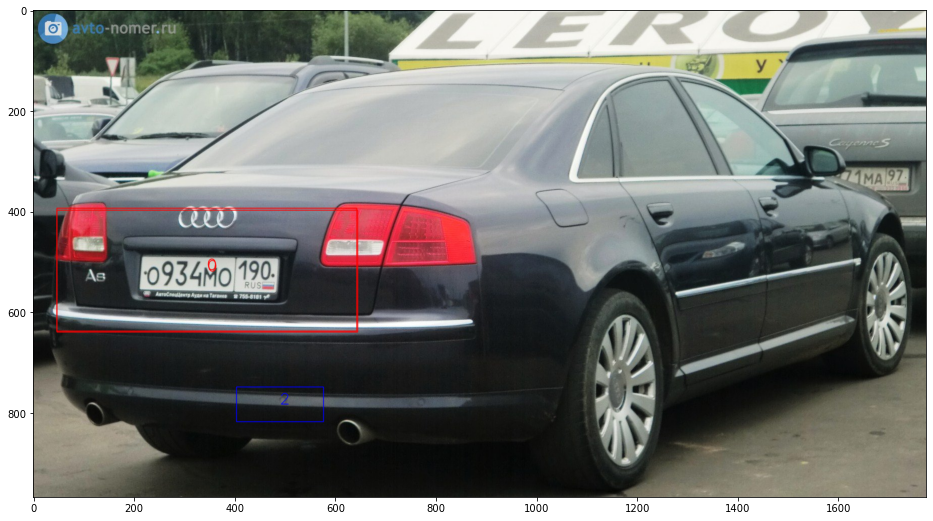

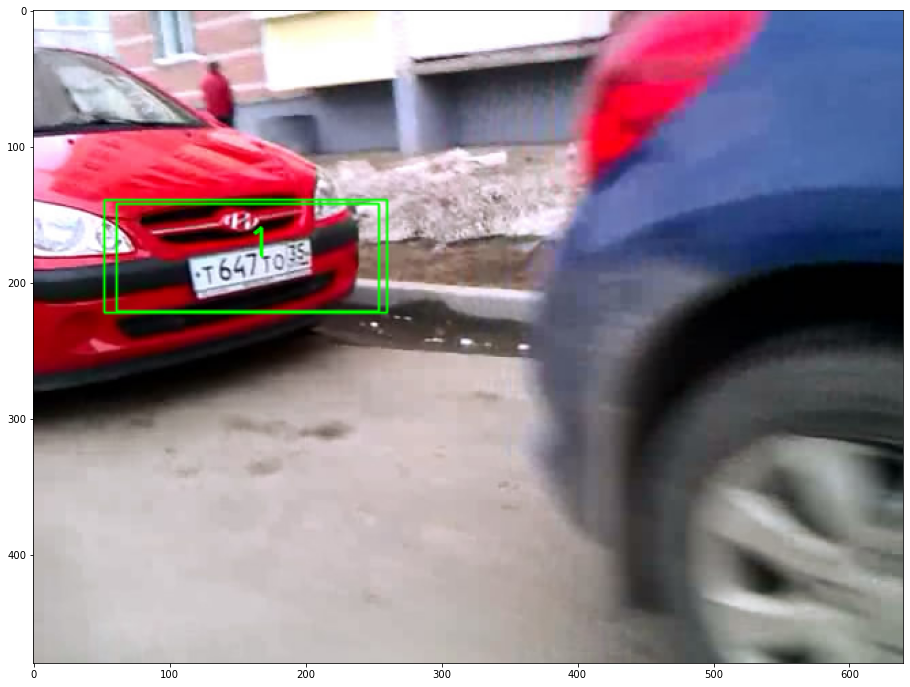

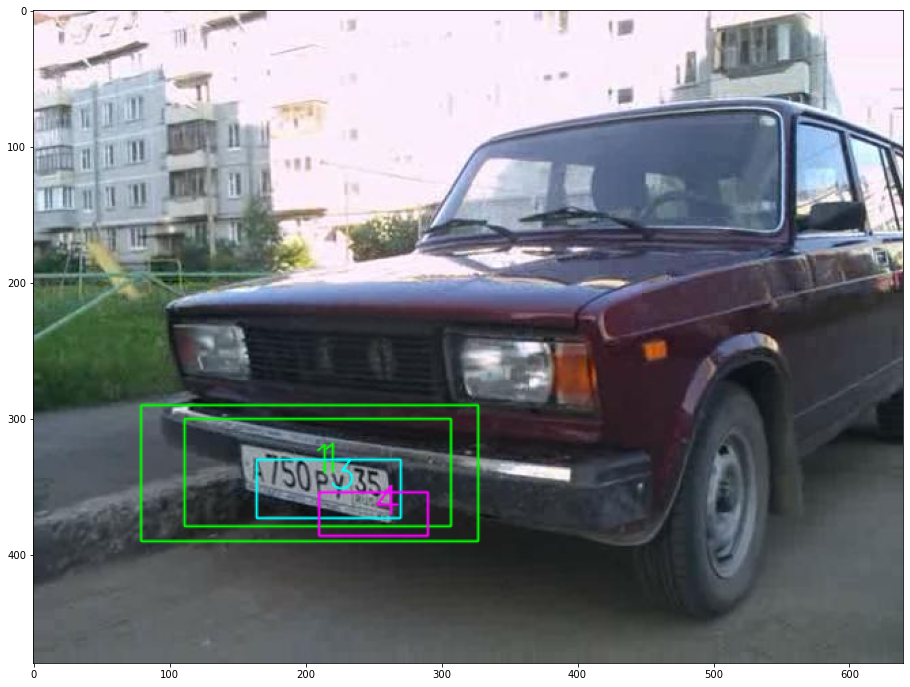

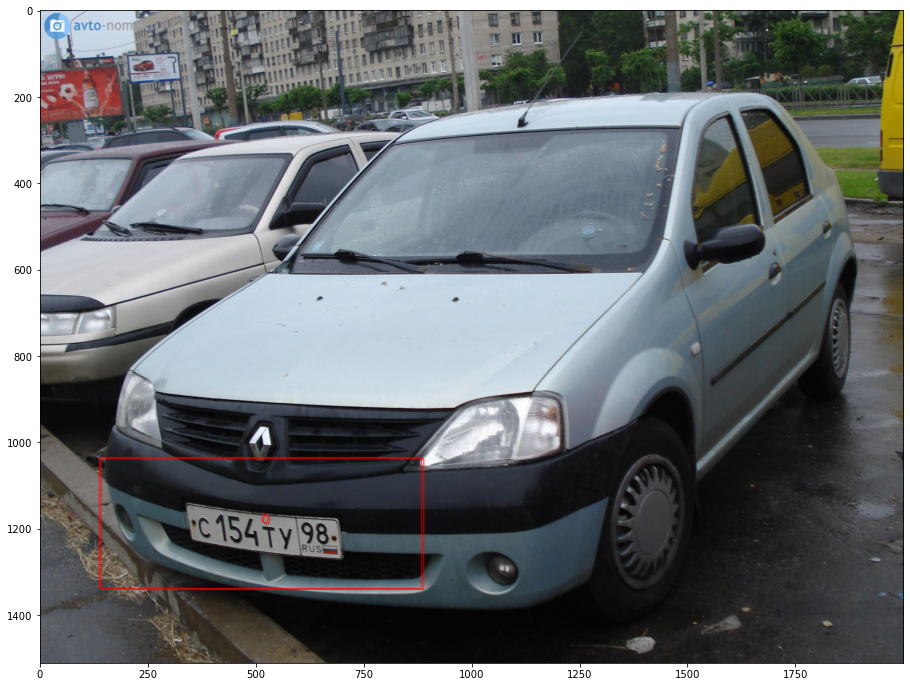

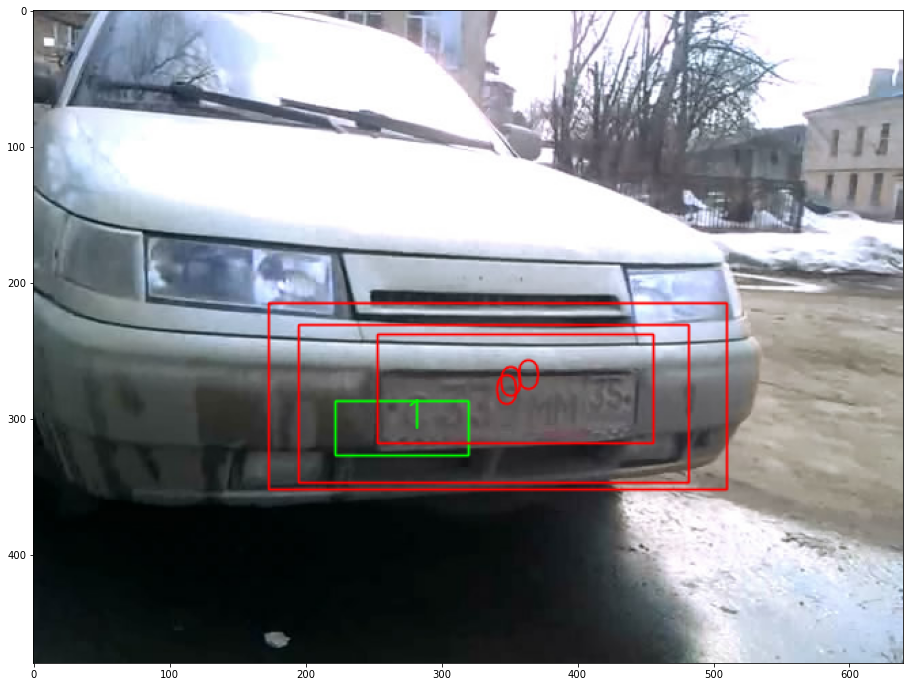

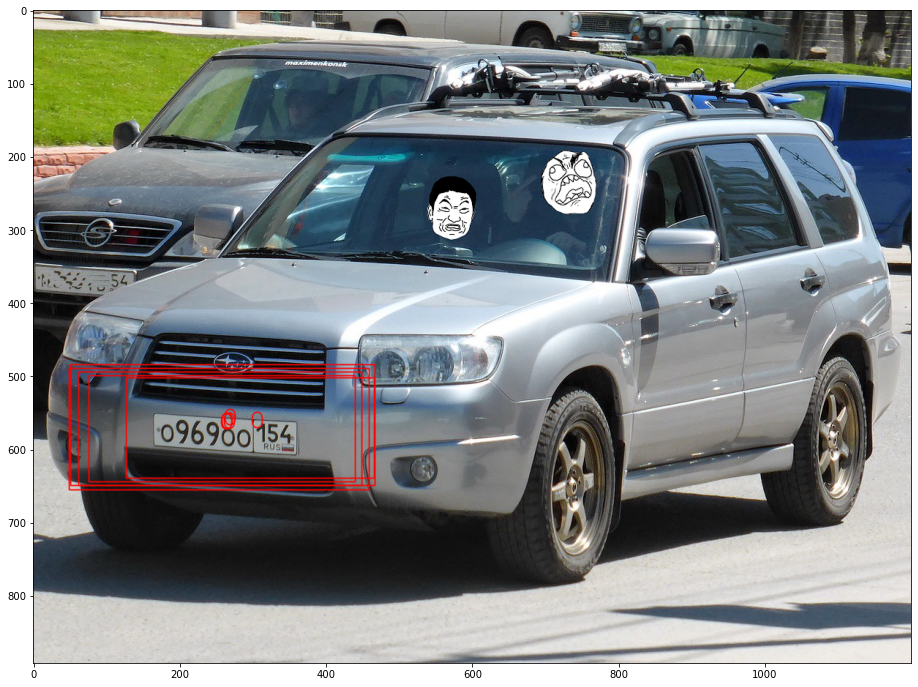

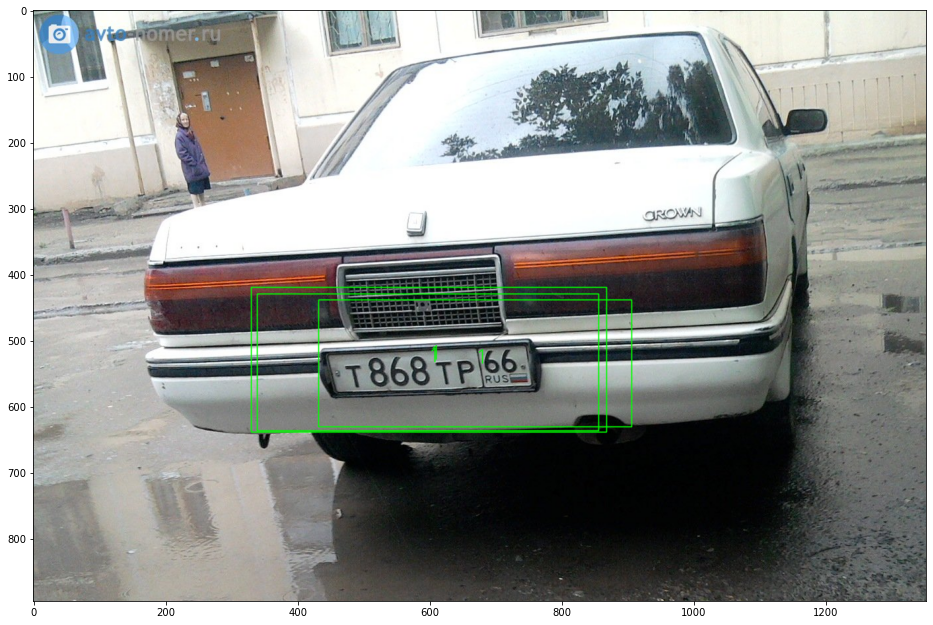

In [9]:
for i in range(10):
    draw_candidates(train_candidates,i)

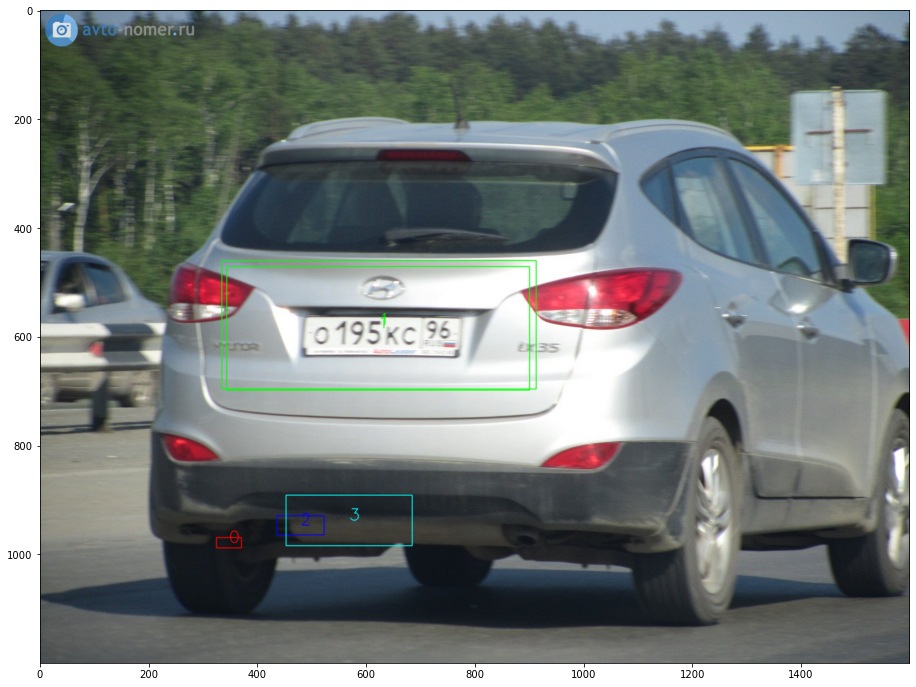

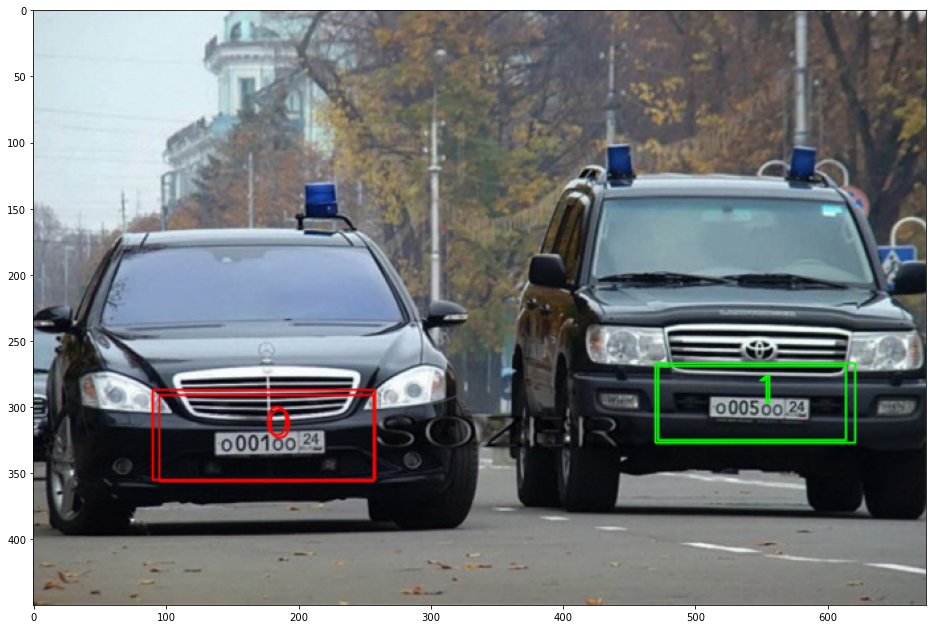

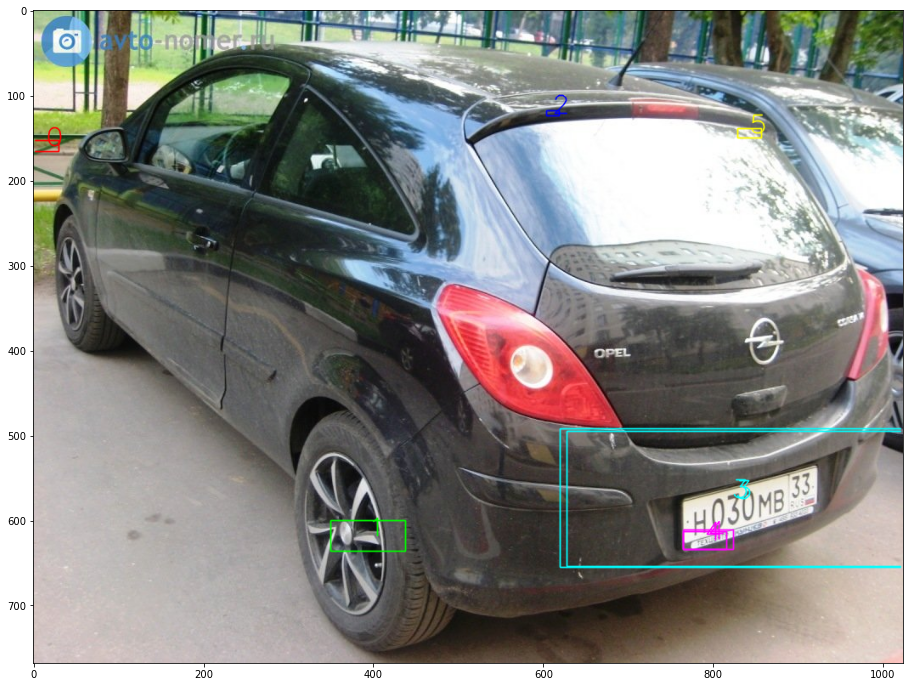

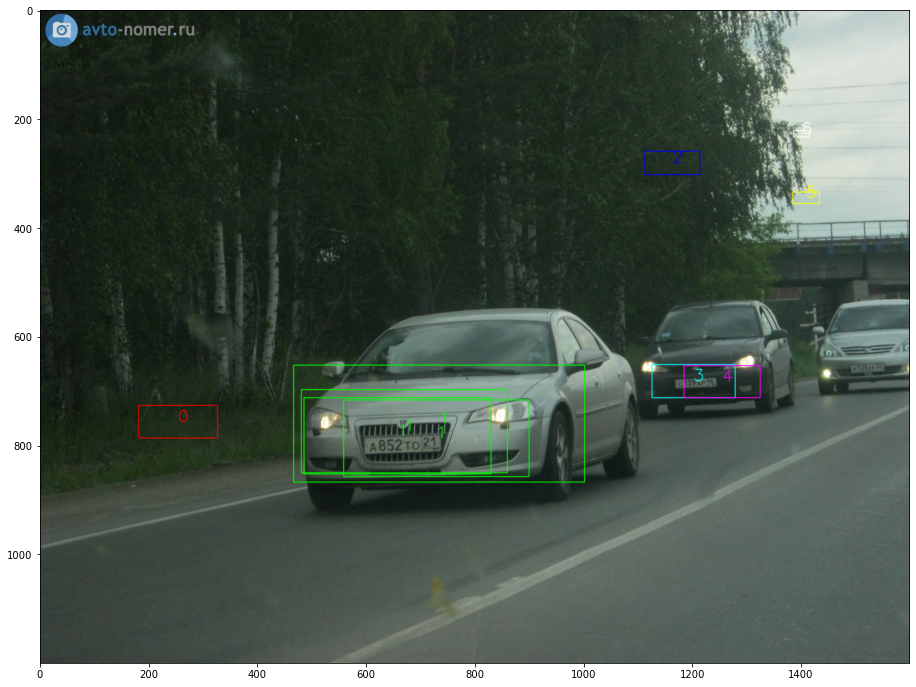

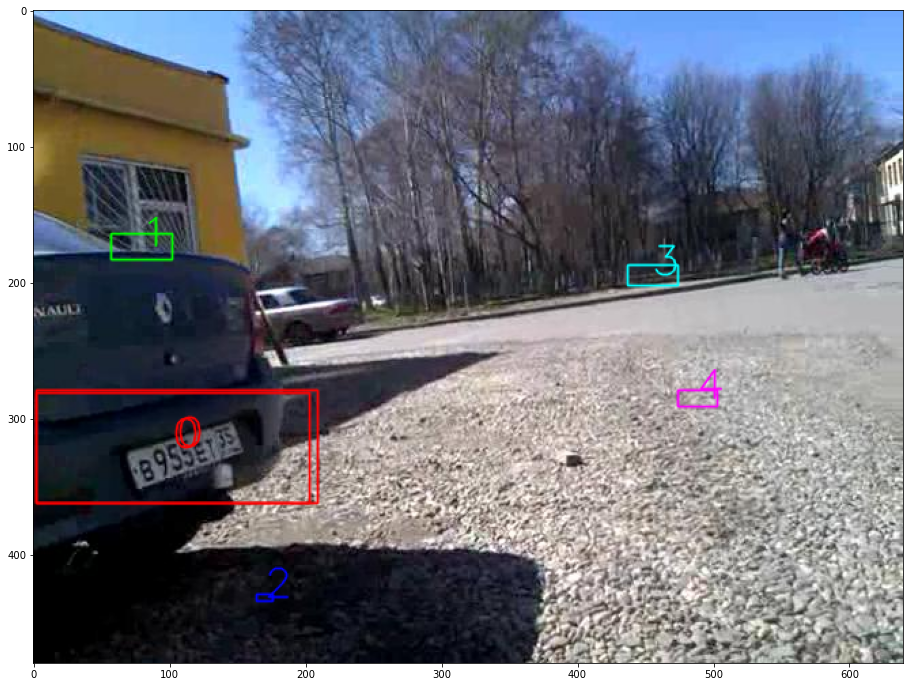

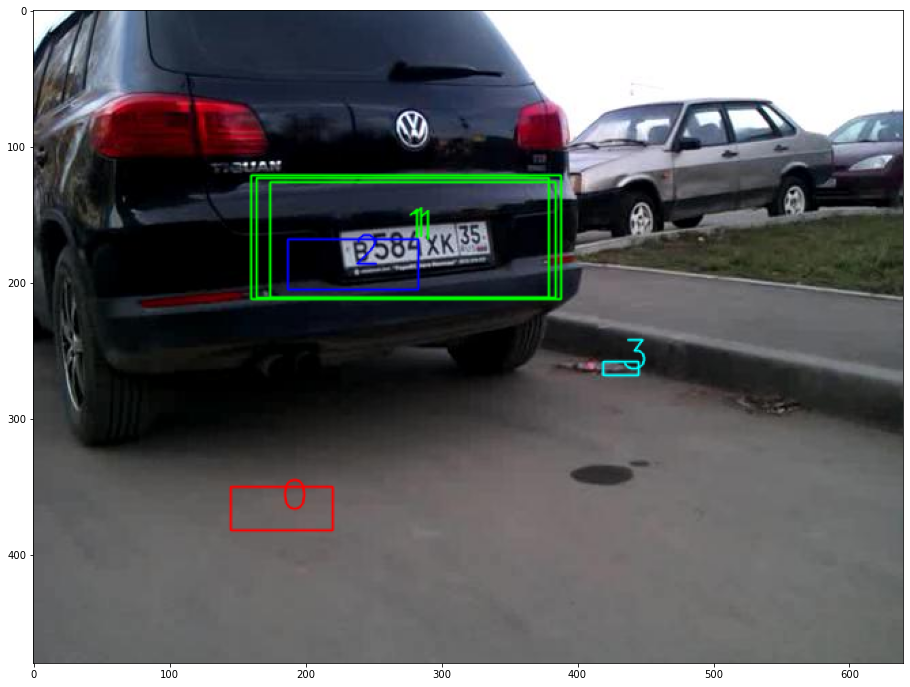

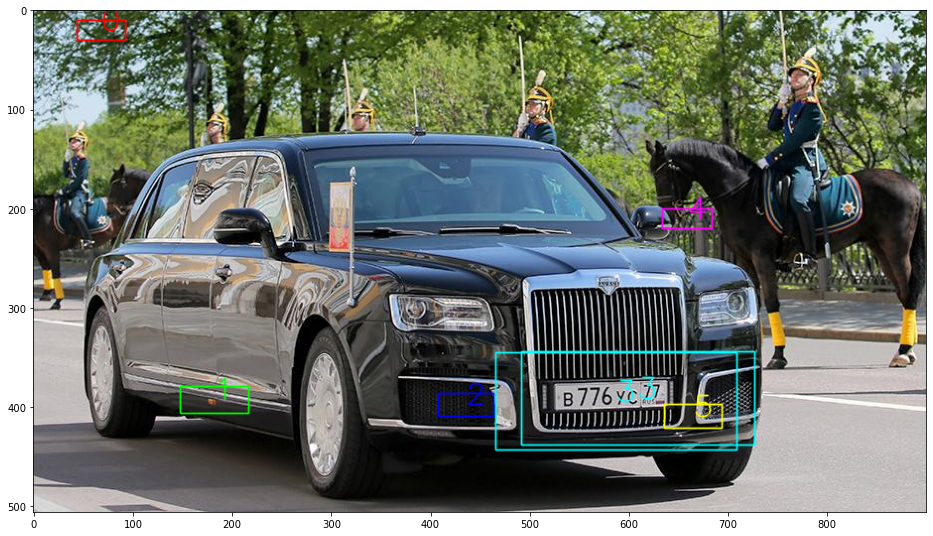

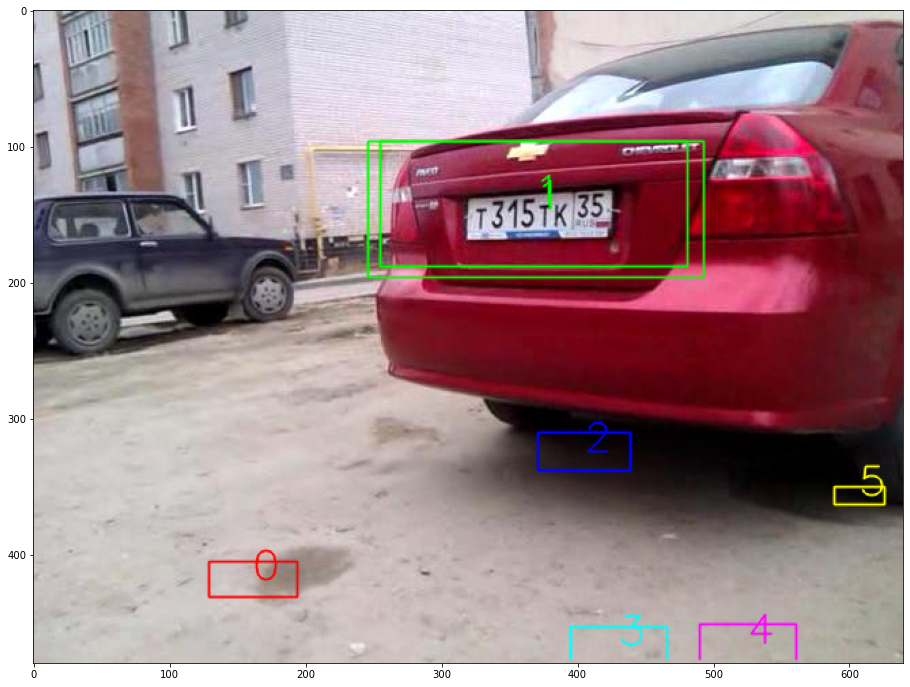

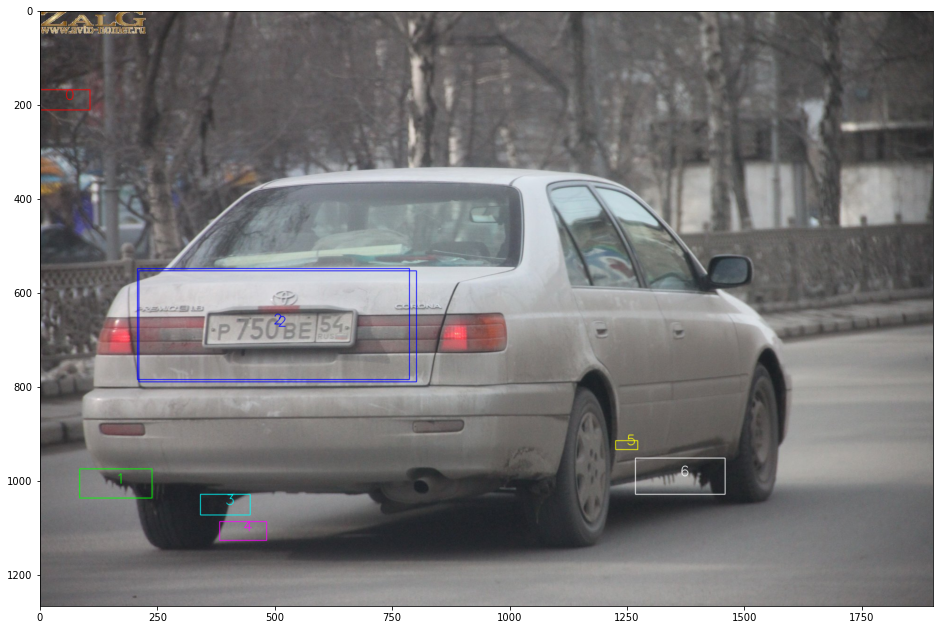

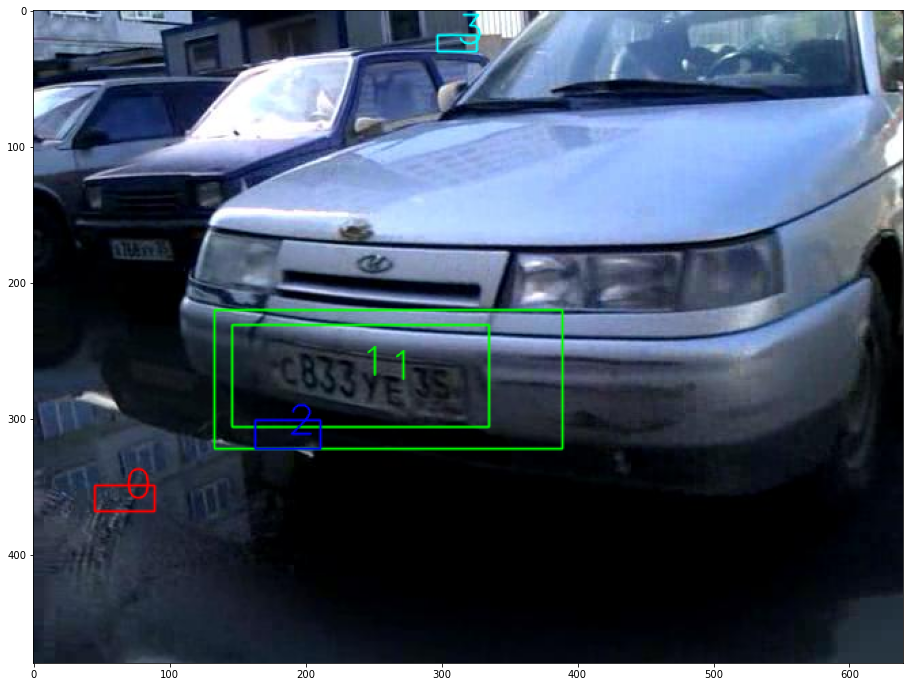

In [10]:
for i in range(10):
    draw_candidates(test_candidates,i)